## Customers Segmentation based on their Credit Card usage bhaviour

Dataset for this notebook consists of credit card usage behavior of customers with 18 behavioral features. Segmentation of customers can be used to define marketing strategies.


**Content of this Kernel:**
* Data Preprocessing
* Clustering using KMeans
* Interpretation of Clusters
* Visualization of Clusters using PCA

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import DBSCAN
from sklearn.cluster import AffinityPropagation

In [3]:
data= pd.read_csv("CC GENERAL.csv")

In [4]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [6]:
data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [7]:
for i in data.columns:
    print(i, len(data[i].value_counts()))

CUST_ID 8950
BALANCE 8871
BALANCE_FREQUENCY 43
PURCHASES 6203
ONEOFF_PURCHASES 4014
INSTALLMENTS_PURCHASES 4452
CASH_ADVANCE 4323
PURCHASES_FREQUENCY 47
ONEOFF_PURCHASES_FREQUENCY 47
PURCHASES_INSTALLMENTS_FREQUENCY 47
CASH_ADVANCE_FREQUENCY 54
CASH_ADVANCE_TRX 65
PURCHASES_TRX 173
CREDIT_LIMIT 205
PAYMENTS 8711
MINIMUM_PAYMENTS 8636
PRC_FULL_PAYMENT 47
TENURE 7


In [8]:
data_ = data.drop('CUST_ID', axis=1)

In [9]:
col_ = data_.columns

In [10]:
imputer = KNNImputer(n_neighbors=7, weights='distance')#
df_knn = imputer.fit_transform(data_)
data_ = pd.DataFrame(df_knn)
data_.columns = col_

In [11]:
data_.isnull().sum()

BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [12]:
data = data_

In [13]:
columns=['BALANCE', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'CREDIT_LIMIT',
        'PAYMENTS', 'MINIMUM_PAYMENTS']

for c in columns:
    
    Range=c+'_RANGE'
    data[Range]=0        
    data.loc[((data[c]>0)&(data[c]<=500)),Range]=1
    data.loc[((data[c]>500)&(data[c]<=1000)),Range]=2
    data.loc[((data[c]>1000)&(data[c]<=3000)),Range]=3
    data.loc[((data[c]>3000)&(data[c]<=5000)),Range]=4
    data.loc[((data[c]>5000)&(data[c]<=10000)),Range]=5
    data.loc[((data[c]>10000)),Range]=6
 

In [14]:
columns=['BALANCE_FREQUENCY', 'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 
         'CASH_ADVANCE_FREQUENCY', 'PRC_FULL_PAYMENT']

for c in columns:
    
    Range=c+'_RANGE'
    data[Range]=0
    data.loc[((data[c]>0)&(data[c]<=0.1)),Range]=1
    data.loc[((data[c]>0.1)&(data[c]<=0.2)),Range]=2
    data.loc[((data[c]>0.2)&(data[c]<=0.3)),Range]=3
    data.loc[((data[c]>0.3)&(data[c]<=0.4)),Range]=4
    data.loc[((data[c]>0.4)&(data[c]<=0.5)),Range]=5
    data.loc[((data[c]>0.5)&(data[c]<=0.6)),Range]=6
    data.loc[((data[c]>0.6)&(data[c]<=0.7)),Range]=7
    data.loc[((data[c]>0.7)&(data[c]<=0.8)),Range]=8
    data.loc[((data[c]>0.8)&(data[c]<=0.9)),Range]=9
    data.loc[((data[c]>0.9)&(data[c]<=1.0)),Range]=10
    

In [15]:
columns=['PURCHASES_TRX', 'CASH_ADVANCE_TRX']  

for c in columns:
    
    Range=c+'_RANGE'
    data[Range]=0
    data.loc[((data[c]>0)&(data[c]<=5)),Range]=1
    data.loc[((data[c]>5)&(data[c]<=10)),Range]=2
    data.loc[((data[c]>10)&(data[c]<=15)),Range]=3
    data.loc[((data[c]>15)&(data[c]<=20)),Range]=4
    data.loc[((data[c]>20)&(data[c]<=30)),Range]=5
    data.loc[((data[c]>30)&(data[c]<=50)),Range]=6
    data.loc[((data[c]>50)&(data[c]<=100)),Range]=7
    data.loc[((data[c]>100)),Range]=8

In [16]:
data.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,...,PAYMENTS_RANGE,MINIMUM_PAYMENTS_RANGE,BALANCE_FREQUENCY_RANGE,PURCHASES_FREQUENCY_RANGE,ONEOFF_PURCHASES_FREQUENCY_RANGE,PURCHASES_INSTALLMENTS_FREQUENCY_RANGE,CASH_ADVANCE_FREQUENCY_RANGE,PRC_FULL_PAYMENT_RANGE,PURCHASES_TRX_RANGE,CASH_ADVANCE_TRX_RANGE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,...,1,1,9,2,0,1,0,0,1,0
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,...,4,3,10,0,0,0,3,3,0,1
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,...,2,2,10,10,10,0,0,0,3,0
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,...,0,1,7,1,1,0,1,0,1,1
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,...,2,1,10,1,1,0,0,0,1,0


In [17]:
data.drop(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES','ONEOFF_PURCHASES',
           'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
           'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
           'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
           'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 
           'PRC_FULL_PAYMENT' ], axis=1, inplace=True)

X= np.asarray(data)

Normalizing input values.

In [18]:
scaler = StandardScaler()

X_s = scaler.fit_transform(X)
X_s = pd.DataFrame(X_s)

In [19]:
X_s.columns = data.columns
X_s.columns

Index(['TENURE', 'BALANCE_RANGE', 'PURCHASES_RANGE', 'ONEOFF_PURCHASES_RANGE',
       'INSTALLMENTS_PURCHASES_RANGE', 'CASH_ADVANCE_RANGE',
       'CREDIT_LIMIT_RANGE', 'PAYMENTS_RANGE', 'MINIMUM_PAYMENTS_RANGE',
       'BALANCE_FREQUENCY_RANGE', 'PURCHASES_FREQUENCY_RANGE',
       'ONEOFF_PURCHASES_FREQUENCY_RANGE',
       'PURCHASES_INSTALLMENTS_FREQUENCY_RANGE',
       'CASH_ADVANCE_FREQUENCY_RANGE', 'PRC_FULL_PAYMENT_RANGE',
       'PURCHASES_TRX_RANGE', 'CASH_ADVANCE_TRX_RANGE'],
      dtype='object')

In [20]:
X_s.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   TENURE                                  8950 non-null   float64
 1   BALANCE_RANGE                           8950 non-null   float64
 2   PURCHASES_RANGE                         8950 non-null   float64
 3   ONEOFF_PURCHASES_RANGE                  8950 non-null   float64
 4   INSTALLMENTS_PURCHASES_RANGE            8950 non-null   float64
 5   CASH_ADVANCE_RANGE                      8950 non-null   float64
 6   CREDIT_LIMIT_RANGE                      8950 non-null   float64
 7   PAYMENTS_RANGE                          8950 non-null   float64
 8   MINIMUM_PAYMENTS_RANGE                  8950 non-null   float64
 9   BALANCE_FREQUENCY_RANGE                 8950 non-null   float64
 10  PURCHASES_FREQUENCY_RANGE               8950 non-null   floa

## KMeans

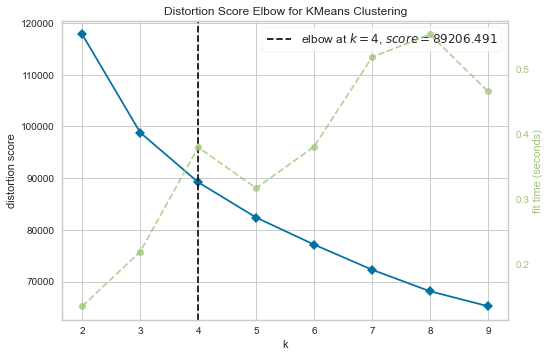

In [21]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,10))

visualizer.fit(X_s)
visualizer.show()
plt.show()

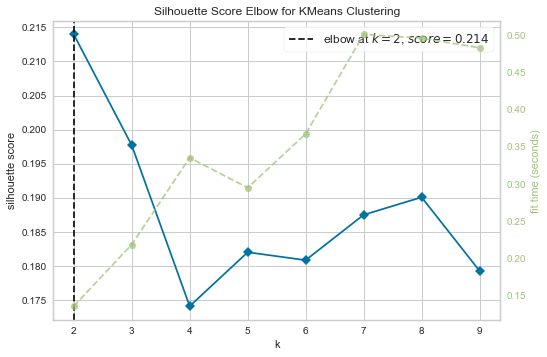

In [22]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,10), metric='silhouette')

visualizer.fit(X_s)
visualizer.show()
plt.show()

In [23]:
KM_3_clusters = KMeans(n_clusters=3, init='k-means++').fit(X_s) # initialise and fit K-Means model

KM3_clustered = X_s.copy()
KM3_clustered.loc[:,'Cluster'] = KM_3_clusters.labels_ # append labels to points

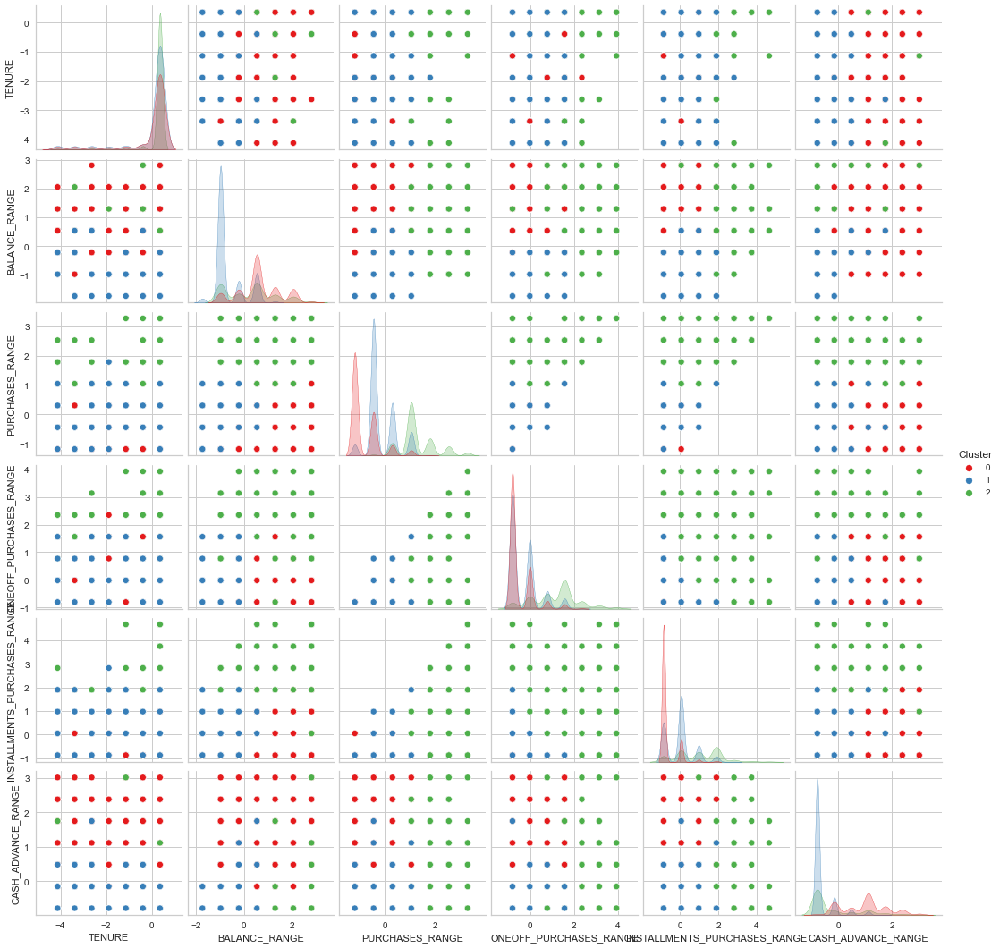

In [24]:
sns.pairplot(KM3_clustered[['TENURE', 'BALANCE_RANGE', 'PURCHASES_RANGE',
                            'ONEOFF_PURCHASES_RANGE', 'INSTALLMENTS_PURCHASES_RANGE',
                            'CASH_ADVANCE_RANGE', 'Cluster']], hue='Cluster', palette='Set1')

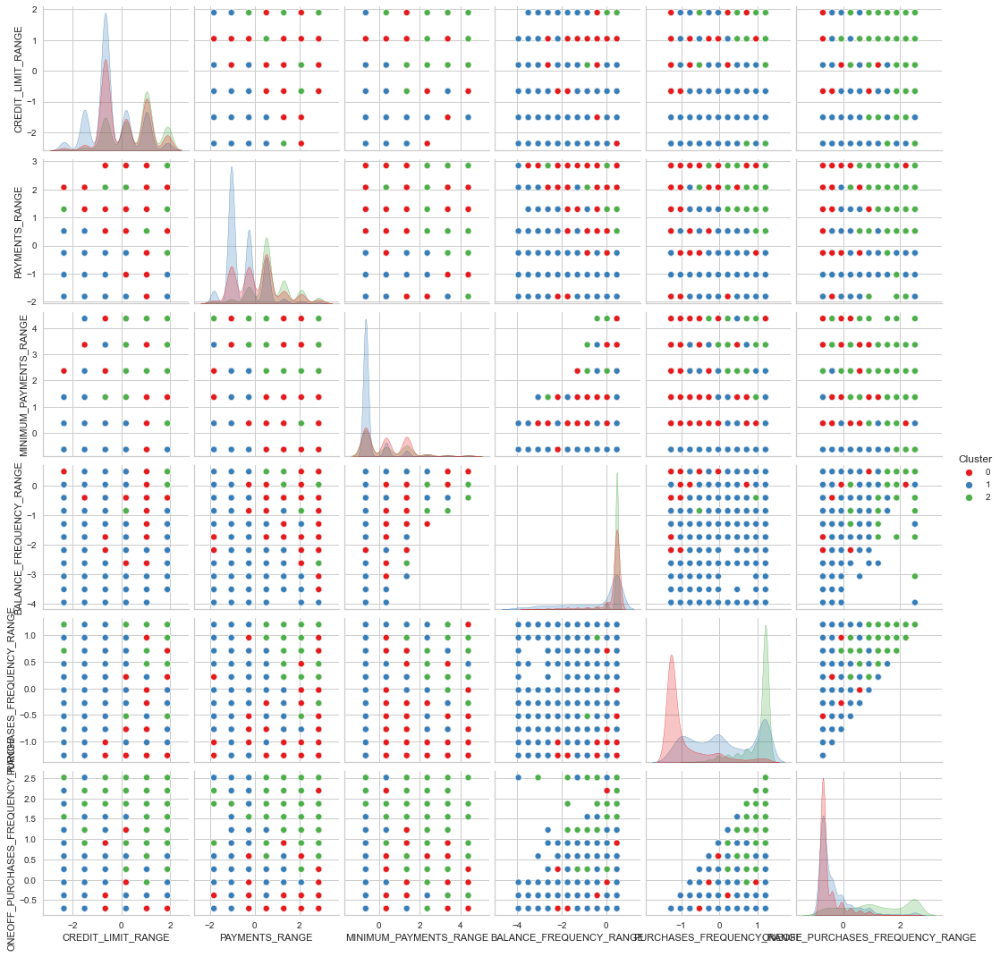

In [25]:
sns.pairplot(KM3_clustered[['CREDIT_LIMIT_RANGE', 'PAYMENTS_RANGE', 'MINIMUM_PAYMENTS_RANGE',
                            'BALANCE_FREQUENCY_RANGE', 'PURCHASES_FREQUENCY_RANGE',
                            'ONEOFF_PURCHASES_FREQUENCY_RANGE', 'Cluster']], hue='Cluster', palette='Set1')

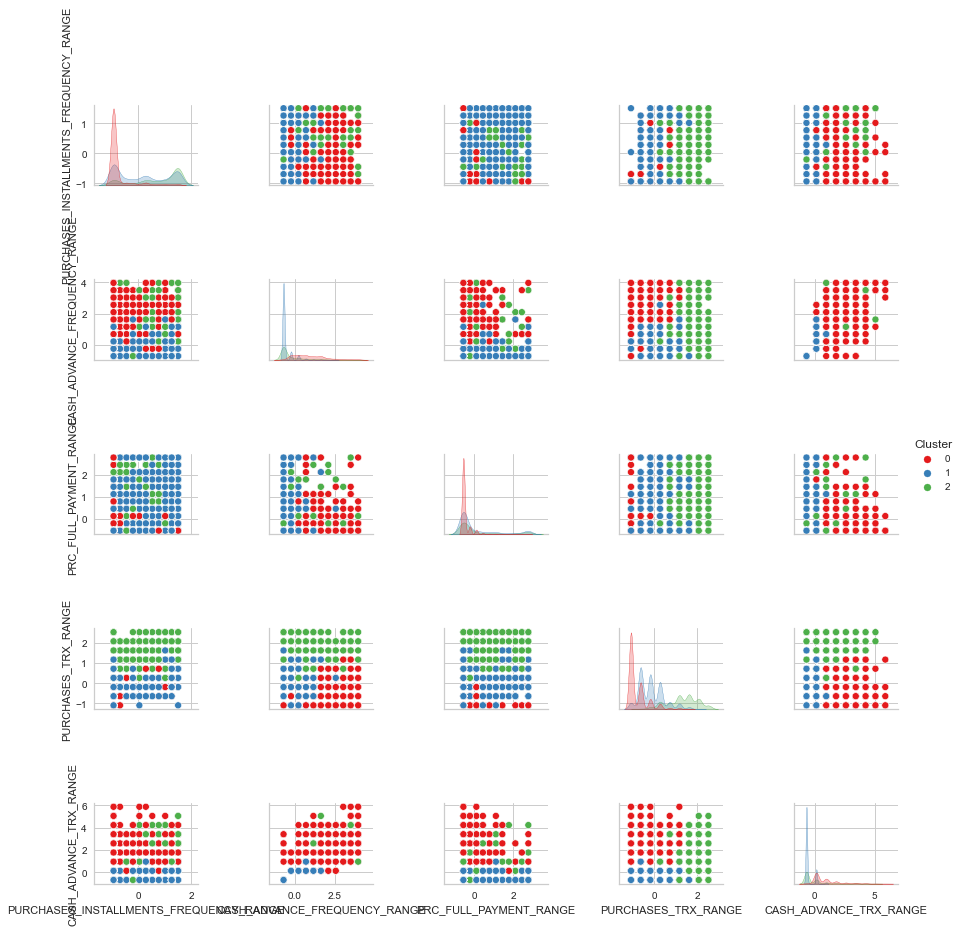

In [26]:
sns.pairplot(KM3_clustered[['PURCHASES_INSTALLMENTS_FREQUENCY_RANGE', 'CASH_ADVANCE_FREQUENCY_RANGE',
                            'PRC_FULL_PAYMENT_RANGE', 'PURCHASES_TRX_RANGE', 'CASH_ADVANCE_TRX_RANGE',
                            'Cluster']], hue='Cluster', palette='Set1')

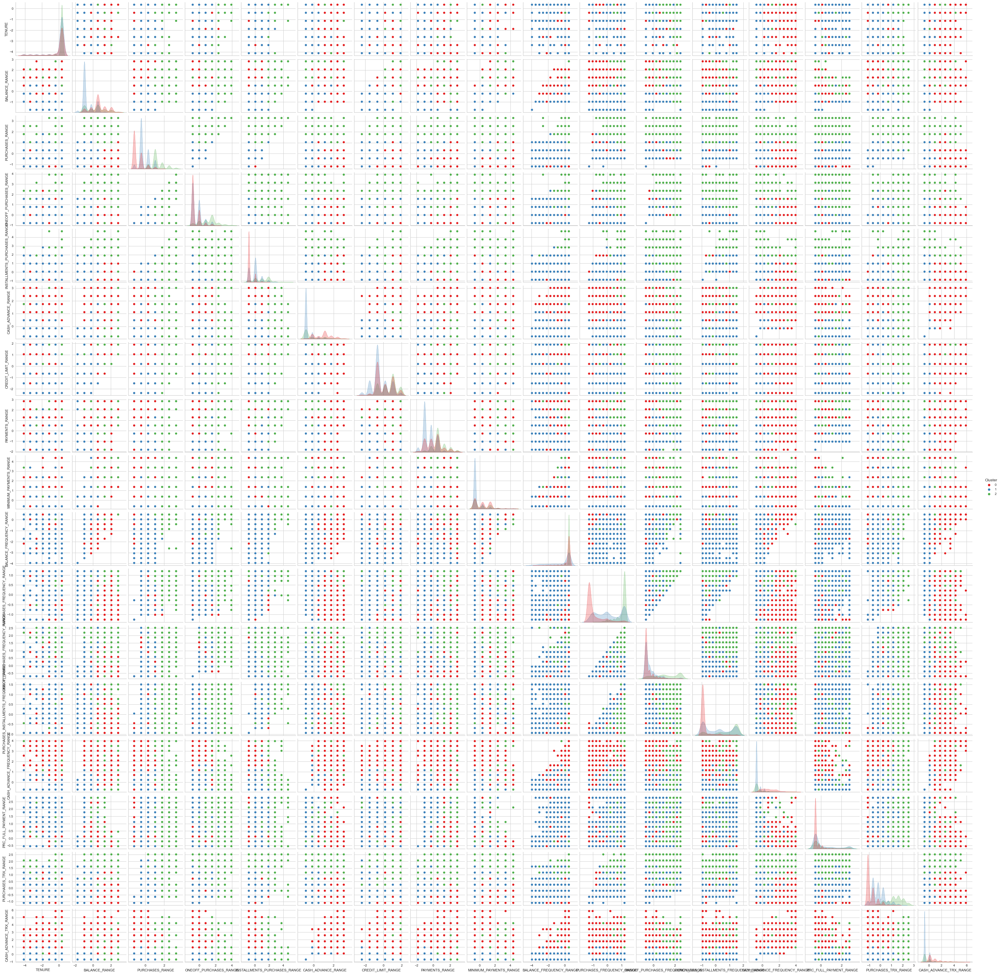

In [27]:
sns.pairplot(KM3_clustered, hue='Cluster', palette='Set1')

## DBSCAN

In [73]:
outlier_percent = []
aaa = []
for eps in np.linspace(0.001,5,75):
    
    # Create Model
    dbscan = DBSCAN(eps=eps,min_samples=2*X_s.shape[1])
    dbscan.fit(X_s)
   
     
    # Log percentage of points that are outliers
    perc_outliers = 100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)
    dbscan.labels_
    X_s_dbscan.loc[:,'Cluster'] = dbscan.labels_
    aaa.append(len(X_s_dbscan['Cluster'].value_counts()))
    outlier_percent.append(perc_outliers)

Text(0.5, 0, 'Epsilon Value')

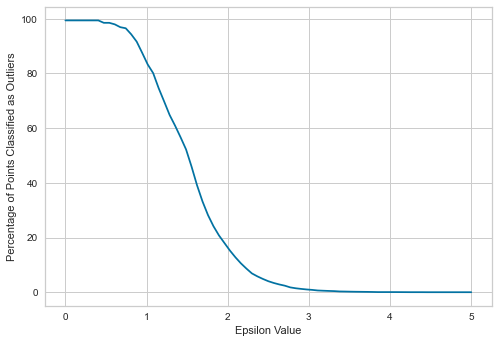

In [74]:
sns.lineplot(x=np.linspace(0.001,5,75),y=outlier_percent)
plt.ylabel("Percentage of Points Classified as Outliers")
plt.xlabel("Epsilon Value")

<AxesSubplot:>

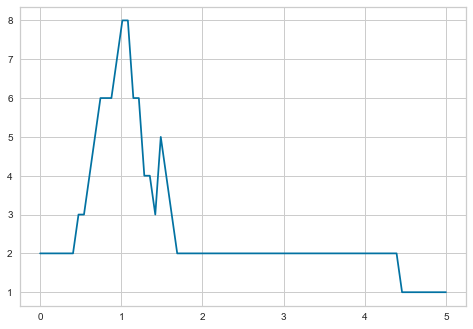

In [76]:
sns.lineplot(x=np.linspace(0.001,5,75),y=aaa)

In [77]:
dbscan = DBSCAN(eps=2,min_samples=2*X_s.shape[1])
dbscan.fit(X_s)
X_s_dbscan = X_s.copy()
X_s_dbscan.loc[:,'Cluster'] = dbscan.labels_ # append labels to points

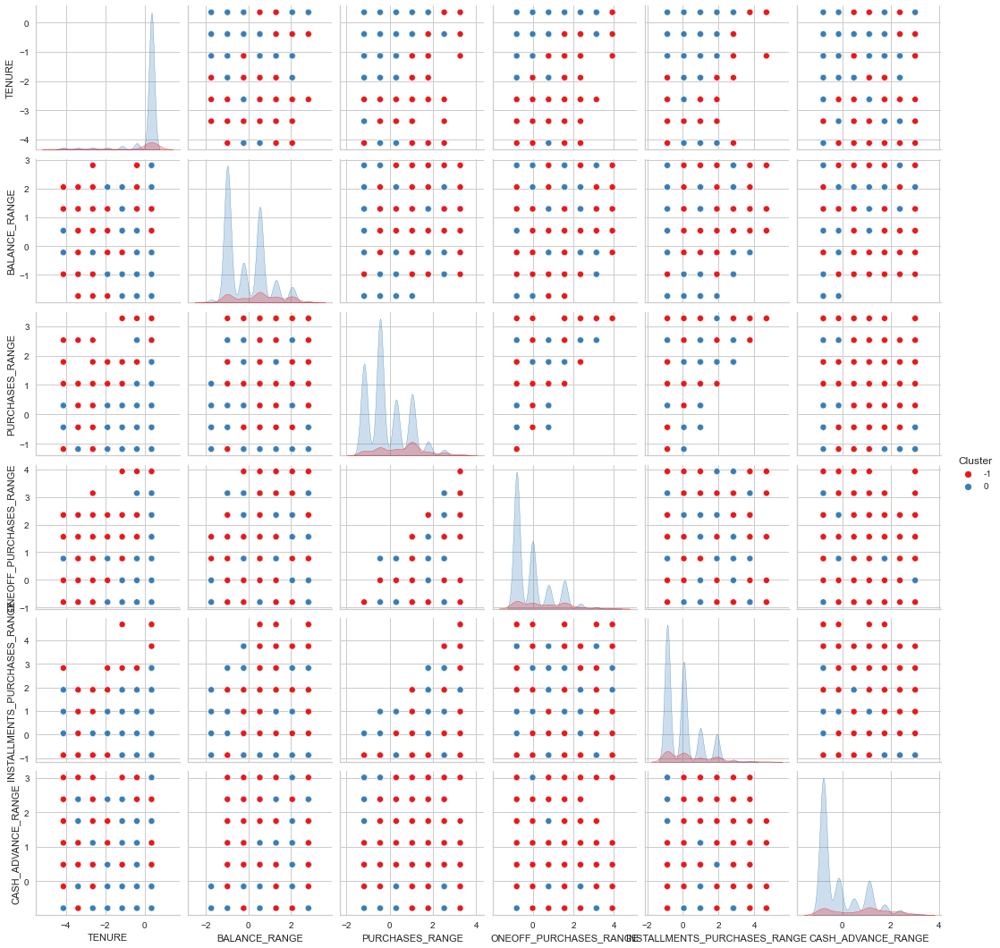

In [78]:
sns.pairplot(X_s_dbscan[['TENURE', 'BALANCE_RANGE', 'PURCHASES_RANGE',
                         'ONEOFF_PURCHASES_RANGE', 'INSTALLMENTS_PURCHASES_RANGE',
                         'CASH_ADVANCE_RANGE','Cluster']], hue='Cluster', palette='Set1')

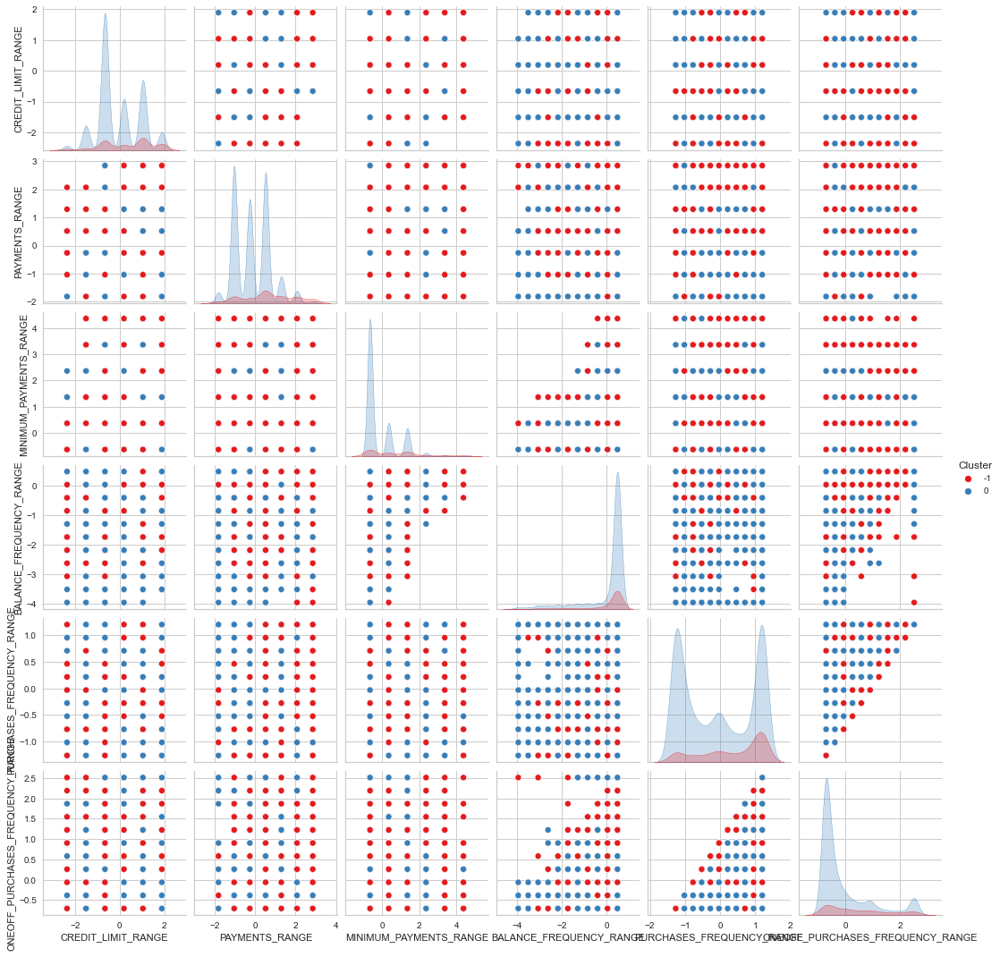

In [79]:
sns.pairplot(X_s_dbscan[['CREDIT_LIMIT_RANGE', 'PAYMENTS_RANGE', 'MINIMUM_PAYMENTS_RANGE',
                            'BALANCE_FREQUENCY_RANGE', 'PURCHASES_FREQUENCY_RANGE',
                            'ONEOFF_PURCHASES_FREQUENCY_RANGE', 'Cluster']], hue='Cluster', palette='Set1')

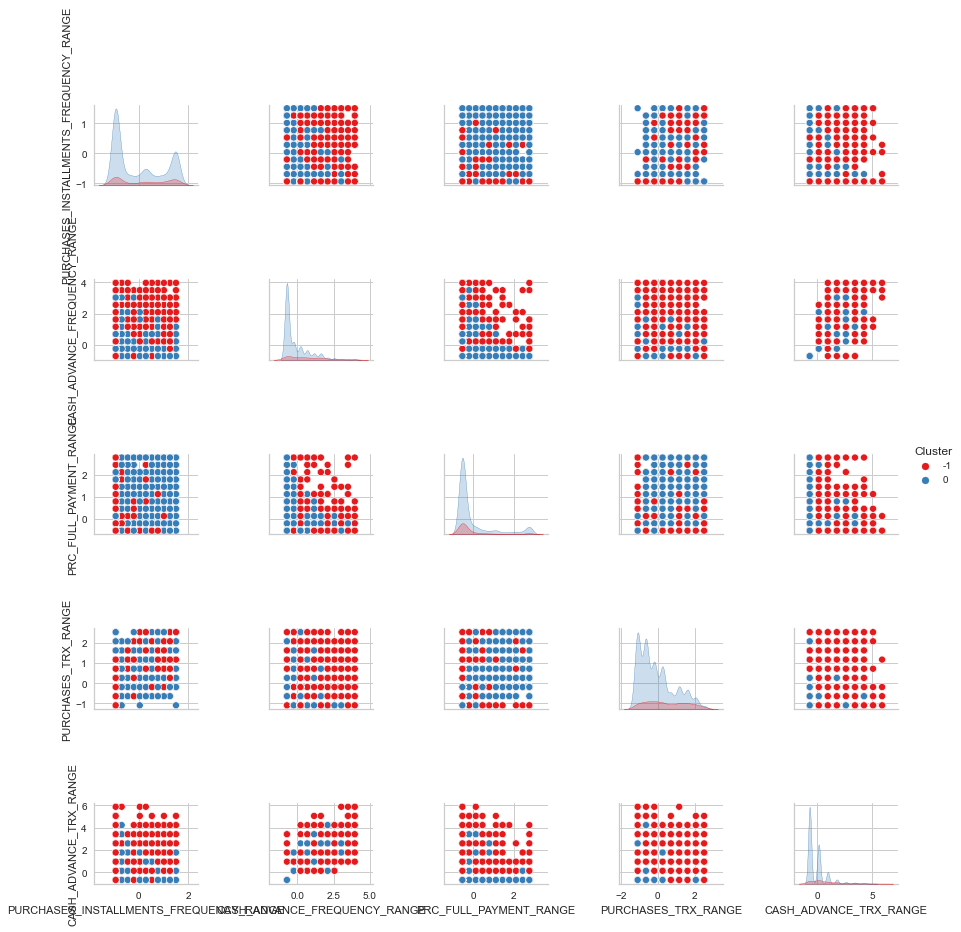

In [80]:
sns.pairplot(X_s_dbscan[['PURCHASES_INSTALLMENTS_FREQUENCY_RANGE', 'CASH_ADVANCE_FREQUENCY_RANGE',
                            'PRC_FULL_PAYMENT_RANGE', 'PURCHASES_TRX_RANGE', 'CASH_ADVANCE_TRX_RANGE',
                            'Cluster']], hue='Cluster', palette='Set1')

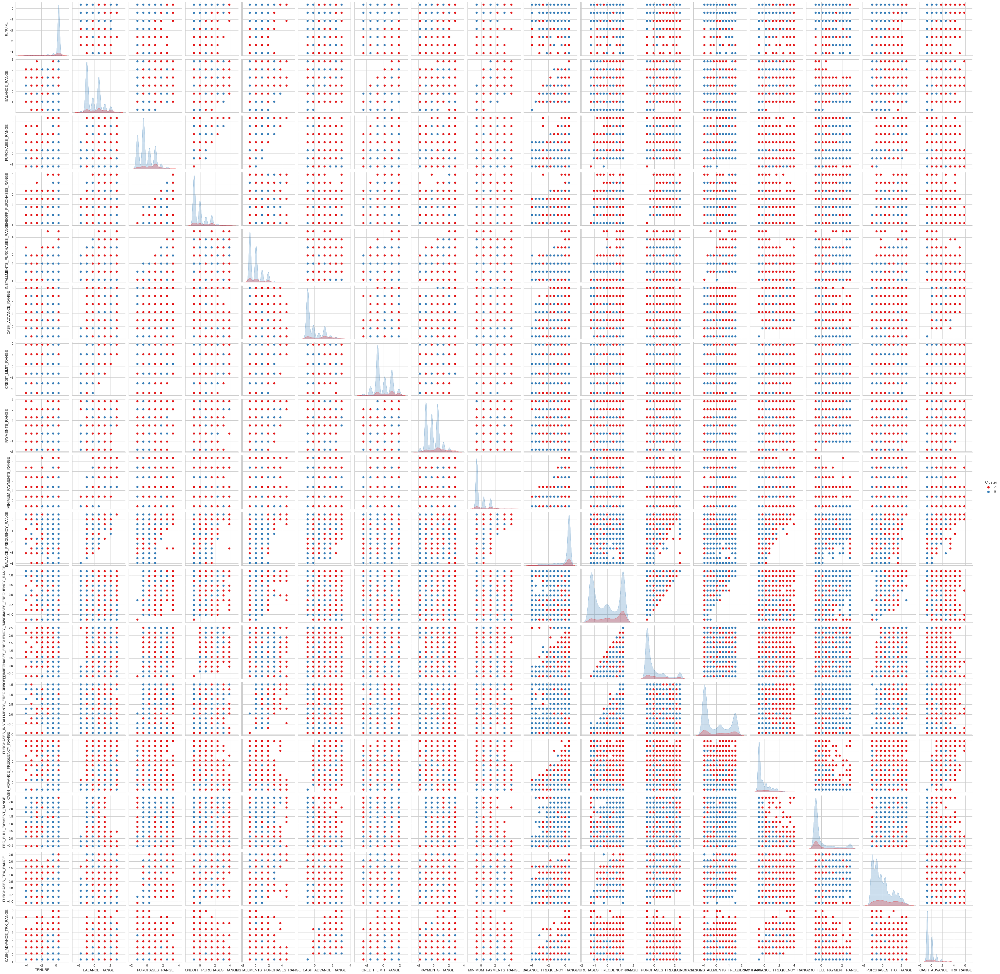

In [82]:
sns.pairplot(X_s_dbscan, hue='Cluster', palette='Set1')

## Вывод:
Данные разрозненные и плохо разделяются. На мой взгляд оптимальное разделение на 2-е категориии.